#EDA Assignment

In [235]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import random
from scipy.stats import t, norm

In [131]:
import warnings
warnings.filterwarnings("ignore")

In [4]:
data = pd.read_excel('employability_outcomes.xlsx')

In [28]:
data.head()

,Unnamed: 0,ID,Salary,DOJ,DOL,Designation,JobCity,Gender,DOB,10percentage,10board,12graduation,12percentage,12board,CollegeID,CollegeTier,Degree,Specialization,collegeGPA,CollegeCityID,CollegeCityTier,CollegeState,GraduationYear,English,Logical,Quant,Domain,ComputerProgramming,ElectronicsAndSemicon,ComputerScience,MechanicalEngg,ElectricalEngg,TelecomEngg,CivilEngg,conscientiousness,agreeableness,extraversion,nueroticism,openess_to_experience
0,train,203097,420000,2012-06-01,present,senior quality engineer,Bangalore,f,1990-02-19,84.3,"board ofsecondary education,ap",2007,95.8,"board of intermediate education,ap",1141,2,B.Tech/B.E.,computer engineering,78.00,1141,0,Andhra Pradesh,2011,515,585,525,0.635979,445,-1,-1,-1,-1,-1,-1,0.9737,0.8128,0.5269,1.35490,-0.4455
1,train,579905,500000,2013-09-01,present,assistant manager,Indore,m,1989-10-04,85.4,cbse,2007,85.0,cbse,5807,2,B.Tech/B.E.,electronics and communication engineering,70.06,5807,0,Madhya Pradesh,2012,695,610,780,0.960603,-1,466,-1,-1,-1,-1,-1,-0.7335,0.3789,1.2396,-0.10760,0.8637
2,train,810601,325000,2014-06-01,present,systems engineer,Chennai,f,1992-08-03,85.0,cbse,2010,68.2,cbse,64,2,B.Tech/B.E.,information technology,70.00,64,0,Uttar Pradesh,2014,615,545,370,0.450877,395,-1,-1,-1,-1,-1,-1,0.2718,1.7109,0.1637,-0.86820,0.6721
3,train,267447,1100000,2011-07-01,present,senior software engineer,Gurgaon,m,1989-12-05,85.6,cbse,2007,83.6,cbse,6920,1,B.Tech/B.E.,computer engineering,74.64,6920,1,Delhi,2011,635,585,625,0.974396,615,-1,-1,-1,-1,-1,-1,0.0464,0.3448,-0.3440,-0.40780,-0.9194
4,train,343523,200000,2014-03-01,2015-03-01 00:00:00,get,Manesar,m,1991-02-27,78.0,cbse,2008,76.8,cbse,11368,2,B.Tech/B.E.,electronics and communication engineering,73.90,11368,0,Uttar Pradesh,2012,545,625,465,0.124502,-1,233,-1,-1,-1,-1,-1,-0.8810,-0.2793,-1.0697,0.09163,-0.1295


In [4]:
data.shape

(3998, 39)

In [5]:
data.describe()

,ID,Salary,10percentage,12graduation,12percentage,CollegeID,CollegeTier,collegeGPA,CollegeCityID,CollegeCityTier,GraduationYear,English,Logical,Quant,Domain,ComputerProgramming,ElectronicsAndSemicon,ComputerScience,MechanicalEngg,ElectricalEngg,TelecomEngg,CivilEngg,conscientiousness,agreeableness,extraversion,nueroticism,openess_to_experience
count,3.998000e+03,3.998000e+03,3998.000000,3998.000000,3998.000000,3998.000000,3998.000000,3998.000000,3998.000000,3998.000000,3998.000000,3998.000000,3998.000000,3998.000000,3998.000000,3998.000000,3998.000000,3998.000000,3998.000000,3998.000000,3998.000000,3998.000000,3998.000000,3998.000000,3998.000000,3998.000000,3998.000000
mean,6.637945e+05,3.076998e+05,77.925443,2008.087544,74.466366,5156.851426,1.925713,71.486171,5156.851426,0.300400,2012.105803,501.649075,501.598799,513.378189,0.510490,353.102801,95.328414,90.742371,22.974737,16.478739,31.851176,2.683842,-0.037831,0.146496,0.002763,-0.169033,-0.138110
std,3.632182e+05,2.127375e+05,9.850162,1.653599,10.999933,4802.261482,0.262270,8.167338,4802.261482,0.458489,31.857271,104.940021,86.783297,122.302332,0.468671,205.355519,158.241218,175.273083,98.123311,87.585634,104.852845,36.658505,1.028666,0.941782,0.951471,1.007580,1.008075
min,1.124400e+04,3.500000e+04,43.000000,1995.000000,40.000000,2.000000,1.000000,6.450000,2.000000,0.000000,0.000000,180.000000,195.000000,120.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-4.126700,-5.781600,-4.600900,-2.643000,-7.375700
25%,3.342842e+05,1.800000e+05,71.680000,2007.000000,66.000000,494.000000,2.000000,66.407500,494.000000,0.000000,2012.000000,425.000000,445.000000,430.000000,0.342315,295.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-0.713525,-0.287100,-0.604800,-0.868200,-0.669200
50%,6.396000e+05,3.000000e+05,79.150000,2008.000000,74.400000,3879.000000,2.000000,71.720000,3879.000000,0.000000,2013.000000,500.000000,505.000000,515.000000,0.622643,415.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,0.046400,0.212400,0.091400,-0.234400,-0.094300
75%,9.904800e+05,3.700000e+05,85.670000,2009.000000,82.600000,8818.000000,2.000000,76.327500,8818.000000,1.000000,2014.000000,570.000000,565.000000,595.000000,0.842248,495.000000,233.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,0.702700,0.812800,0.672000,0.526200,0.502400
max,1.298275e+06,4.000000e+06,97.760000,2013.000000,98.700000,18409.000000,2.000000,99.930000,18409.000000,1.000000,2017.000000,875.000000,795.000000,900.000000,0.999910,840.000000,612.000000,715.000000,623.000000,676.000000,548.000000,516.000000,1.995300,1.904800,2.535400,3.352500,1.822400


In [6]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3998 entries, 0 to 3997
Data columns (total 39 columns):
 #   Column                 Non-Null Count  Dtype         
---  ------                 --------------  -----         
 0   Unnamed: 0             3998 non-null   object        
 1   ID                     3998 non-null   int64         
 2   Salary                 3998 non-null   int64         
 3   DOJ                    3998 non-null   datetime64[ns]
 4   DOL                    3998 non-null   object        
 5   Designation            3998 non-null   object        
 6   JobCity                3998 non-null   object        
 7   Gender                 3998 non-null   object        
 8   DOB                    3998 non-null   datetime64[ns]
 9   10percentage           3998 non-null   float64       
 10  10board                3998 non-null   object        
 11  12graduation           3998 non-null   int64         
 12  12percentage           3998 non-null   float64       
 13  12b

In [7]:
data.drop(columns='Unnamed: 0', inplace = True)

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning
/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


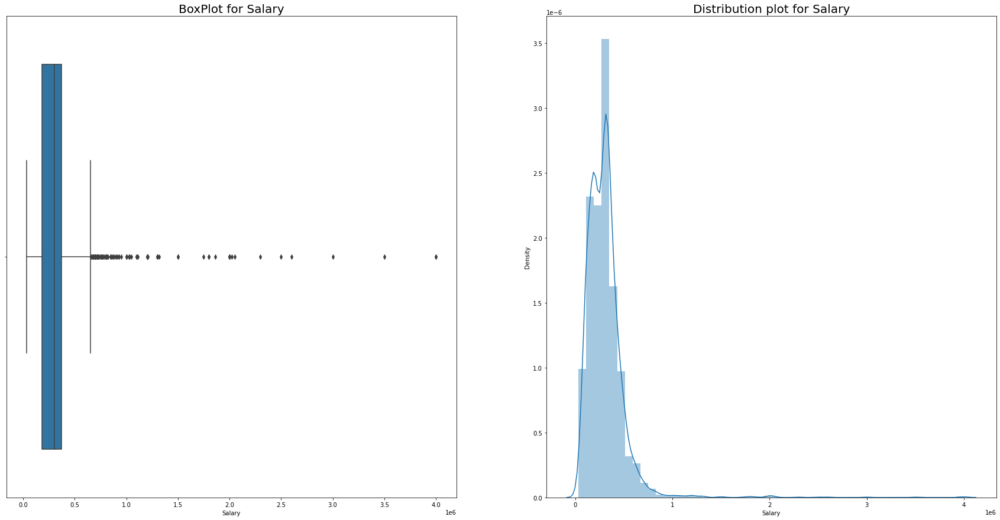

In [79]:
plt.figure(figsize= (30, 15))

plt.subplot(121)
sns.boxplot(data['Salary'])
plt.title('BoxPlot for Salary', fontdict={'fontsize': 20})
plt.xticks(fontsize = 10)

plt.subplot(122)
sns.distplot(data['Salary'])
plt.title('Distribution plot for Salary', fontdict={'fontsize': 20})
plt.xticks(fontsize = 10)
plt.yticks(fontsize = 10)

plt.show()

The above graph tells us that the mean of the salary column lies somewhere around 400,000 with the lowest value at around 100,000.

The above plot also indicates that the salary column has numerous outliers present in it.  
An outlier is a data point in the dataset that differes significantly from the other data or observations.  
*The outlier is inherently different from **Noise**. While Outlier is a data that significantly differs from the other data, Noise is a random error or variance. The outlier is a part of the data, but Noise is just a random error.*  
In this situation the Salary column is the dependent variable and since the number of outliers is great we will not remove them instead we will be performing 2 different types of analysis, one with the outliers while the other without the outliers, in order to understand whether or not the outliers affect the analysis.

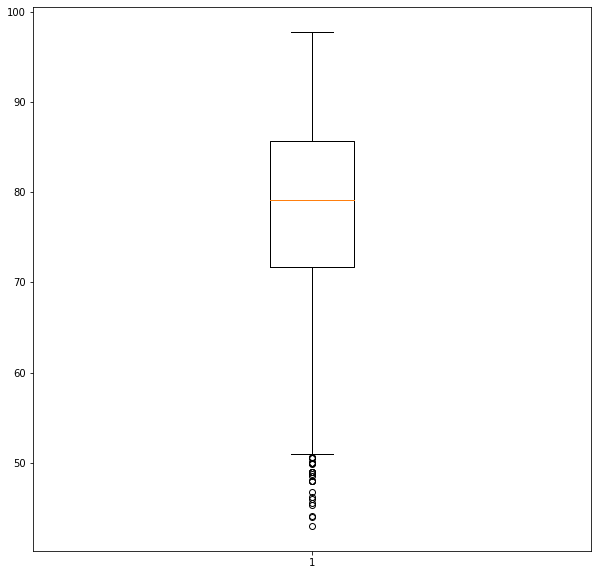

In [11]:
plt.figure(figsize= (10,10))
plt.boxplot(data['10percentage'])
plt.show()

The plot shows us that the mean 10th percentage is around 80% while the maximum is around 97%.

The above boxplot indicates the presence of a few outlier in the 10th percentage column of our data. These outliers can be removed by making use of the following methods:  
* Standard Deviation method
* Interquartile Range method

### **Standard Deviation method**
This method can be used when we know that the data in the sample is Gaussian or Gaussian-like (i.e. Normal distribution or Normal distribution like) (bell-shaped curve or almost a bell shaped curve). The Gaussian distribution has the property that the stndard deviation from the mean can be used to reliably summarise the percentage of values in the sample.  
* 1 Standard Distribution from the Mean has almost 68% of all the data
* 2 Standard Deviations from the Mean covers almost 95% of the data
* 3 Standard Deviations from the Mean covers almost 99.7% of all the data
A value that falls outside of 3 Standard Deviations is part of the distribution, but it is an unlikely or rare event at approximately 1 in 370 samples.  

Three standard deviations from the mean is a common cut-off in practice for identifying outliers in a Gaussian or Gaussian-like distribution. For smaller samples of data, perhaps a value of 2 standard deviations (95%) can be used, and for larger samples, perhaps a value of 4 standard deviations (99.9%) can be used.

/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


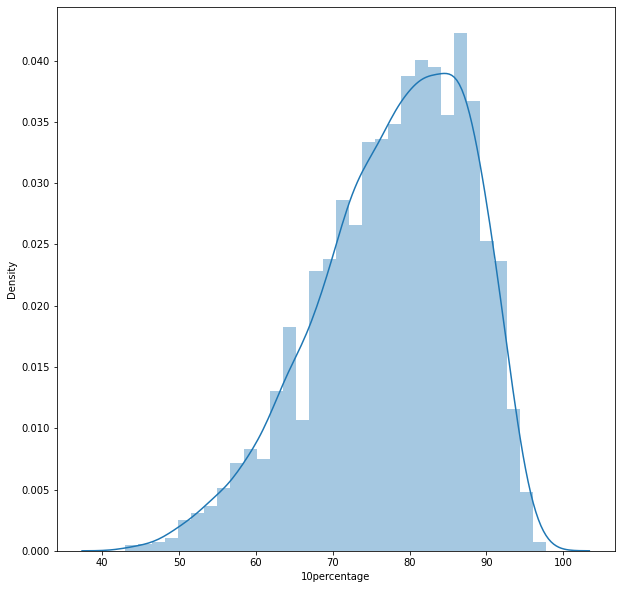

In [23]:
plt.figure(figsize= (10,10))
sns.distplot(data['10percentage'])
plt.show()

The above graph indicates that the outliers for the 10th percentage column are the percentages lower than approximately 50%.  
Maximum number of people have received a percentage of approximately 90% in 10th.

Since the above column is almost normally distributed we can make use of the Standard Deviation method in order to remove the outliers.

In [14]:
mean_10, std_10 = data['10percentage'].mean(), data['10percentage'].std()
cut_off = std_10 * 3
lower, upper = mean_10 - cut_off, mean_10 + cut_off

outliers = [x for x in data['10percentage'] if x < lower or x > upper]

outliers_removed = [x for x in data['10percentage'] if x > lower and x < upper]

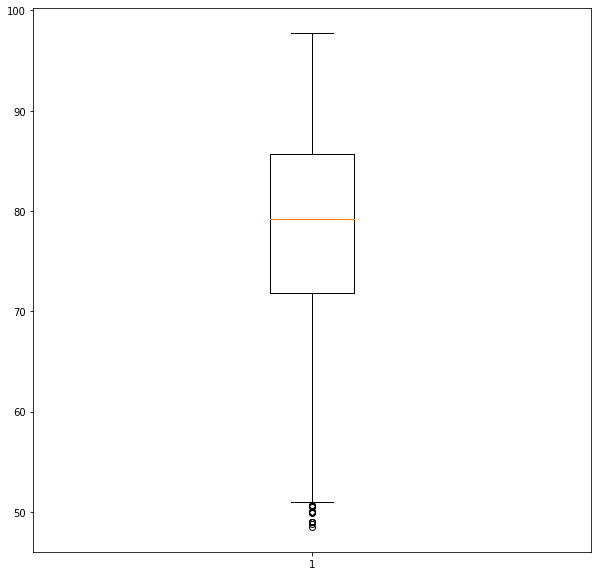

In [15]:
plt.figure(figsize=(10,10))
sns.boxplot(outliers_removed)
plt.show()

It is evident from the above boxplot that the column of 10th percentage has fewer outliers after removal as compared to earlier.

### **Interquartile Range Method**
Not all data is normal or normal enough to treat it as being drawn from a Gaussian distribution.  
A good statistic for summarizing a non-Gaussian distribution sample of data is the Interquartile Range or IQR for short.  
The IQR is calculated as the difference between the 75th and the 25th percentiles of the data and defines the box in a box and whisker plot as seen previously.  
The percentiles can be calculated by sorting the data and selecting values at specific indices. The 50th percentile is the middle value, or the average of the 2 middle values for an even number of data points.  
We refer to the percentiles as quartiles because the data is divided into four groups via the 25th, 50th and 75th values.  
The IQR defines the middle 50% of the data, or the body of the data.  
The IQR can be used to identify outliers by defining limits on the sample values that are a factor k of the IQR below the 25th percentile or above the 75th percentile. The common value for the factor k is the value 1.5. A factor k of 3 or more can be used to identify values that are extreme outliers or “far outs” when described in the context of box and whisker plots.

In [21]:
q25, q75 = np.percentile(data['10percentage'], 25), np.percentile(data['10percentage'], 75)
iqr = q75 - q25

cut_off = iqr * 1.5
lower, upper = q25 - cut_off, q75 + cut_off

outliers = [x for x in data['10percentage'] if x < lower or x > upper]

outliers_removed = [x for x in data['10percentage'] if x > lower and x < upper]

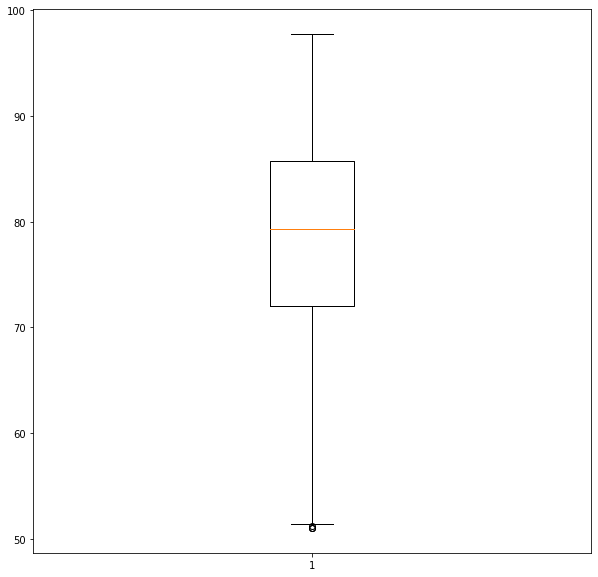

In [22]:
plt.figure(figsize=(10,10))
sns.boxplot(outliers_removed)
plt.show()

The above plot shows that the IQR method worked better at removing the outliers from the column. This is because of the fact that the colum is not a perfect Gaussian distribution making the Standard Deviation method less effective for it.

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning
/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


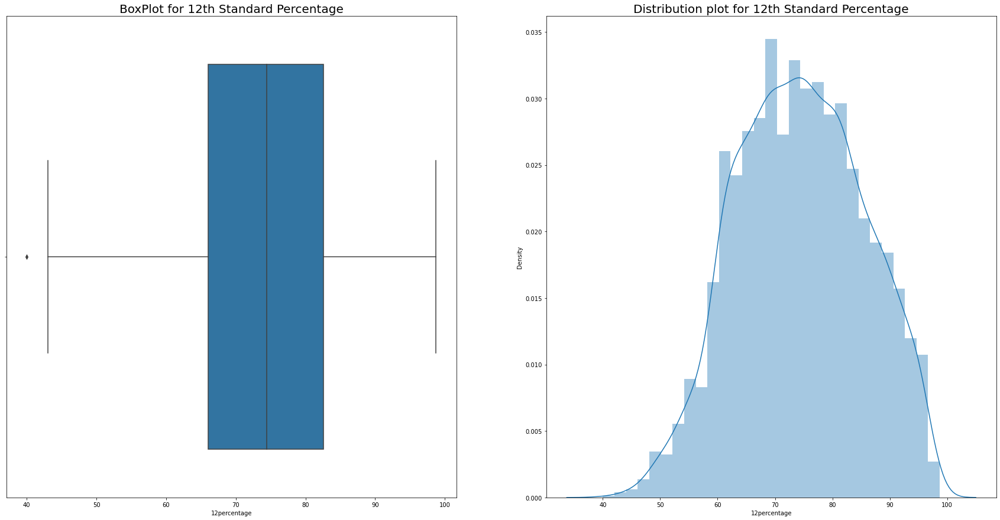

In [81]:
plt.figure(figsize= (30,15))

plt.subplot(121)
sns.boxplot(data['12percentage'])
plt.title('BoxPlot for 12th Standard Percentage', fontdict={'fontsize': 20})
plt.xticks(fontsize = 10)

plt.subplot(122)
sns.distplot(data['12percentage'])
plt.title('Distribution plot for 12th Standard Percentage', fontdict={'fontsize': 20})
plt.xticks(fontsize = 10)
plt.yticks(fontsize = 10)

plt.show()

The above plot shows the presence of a single outlier. This particular outlier could be due to an error and hence can simply be removed from the dataset. It also shows that the average 12th percentage is at approximately 75% while the highest percentage is around 99%.

It can be seen in the distribution plot that the most commonly obtained percentage is 70% in the 12th standard.

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning
/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


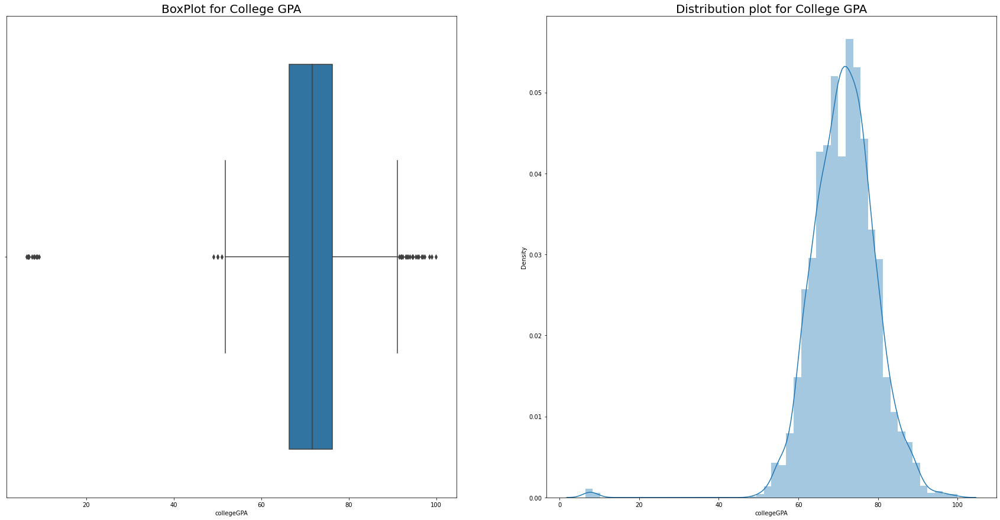

In [82]:
plt.figure(figsize= (30,15))

plt.subplot(121)
sns.boxplot(data['collegeGPA'])
plt.title('BoxPlot for College GPA', fontdict={'fontsize': 20})
plt.xticks(fontsize = 10)

plt.subplot(122)
sns.distplot(data['collegeGPA'])
plt.title('Distribution plot for College GPA', fontdict={'fontsize': 20})
plt.xticks(fontsize = 10)
plt.yticks(fontsize = 10)

plt.show()

There exist a large number of outliers in this particular column. However, these outliers could actually correspond to the real data. In order to decide whether we wish to remove these outliers or not we can perform 2 separate analysis, one with the outliers while the other without the outliers.  
This plot also indicates that the mean value for the College GPA is around 70%.

From the distribution plot it can be interpreted that the most common college GPA is 78% wuth the presence of quite a few outliers.  
The outliers are GPAs less than around 50% and greater than about 90%.

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning
/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


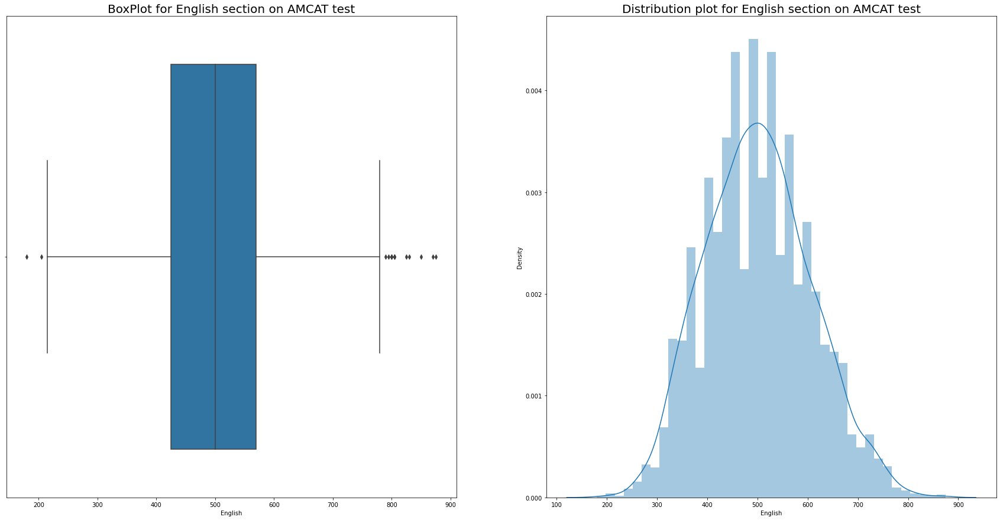

In [85]:
plt.figure(figsize= (30,15))

plt.subplot(121)
sns.boxplot(data['English'])
plt.title('BoxPlot for English section on AMCAT test', fontdict={'fontsize': 20})
plt.xticks(fontsize = 10)

plt.subplot(122)
sns.distplot(data['English'])
plt.title('Distribution plot for English section on AMCAT test', fontdict={'fontsize': 20})
plt.xticks(fontsize = 10)
plt.yticks(fontsize = 10)

plt.show()

Quite a few outliers are present in the above column too. These can be removed using the previously mentioned methods or they can be kept in the data and 2 different kinds of analysis can be performed on them as mentioned previously.

The distribution plot shows us that the most common score on the English section of the AMCAT test was 500. There also exist a few outliers, these are the marks which are greater than about 800 or less than about 200.

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning
/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


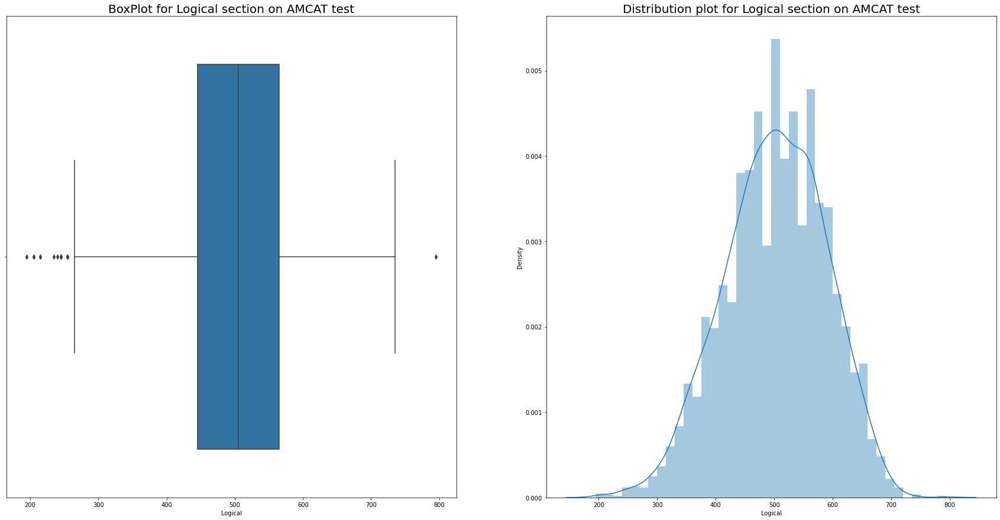

In [86]:
plt.figure(figsize= (30,15))

plt.subplot(121)
sns.boxplot(data['Logical'])
plt.title('BoxPlot for Logical section on AMCAT test', fontdict={'fontsize': 20})
plt.xticks(fontsize=10)

plt.subplot(122)
sns.distplot(data['Logical'])
plt.title('Distribution plot for Logical section on AMCAT test', fontdict={'fontsize': 20})
plt.xticks(fontsize=10)
plt.xticks(fontsize=10)

plt.show()

There exist a few outliers in the above column these can be dealt with by making use of the previosuly mentioned ways.  
The above column has the mean at around 500, indicating that the average marks scored by various people in the Logical section of the AMCAT test was around 500.

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning
/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


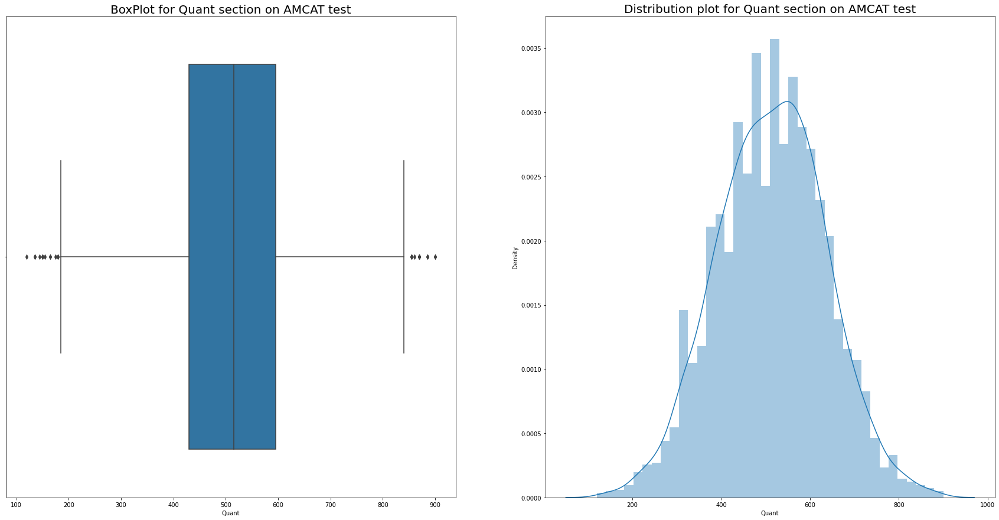

In [87]:
plt.figure(figsize= (30,15))

plt.subplot(121)
sns.boxplot(data['Quant'])
plt.title('BoxPlot for Quant section on AMCAT test', fontdict={'fontsize': 20})
plt.xticks(fontsize=10)

plt.subplot(122)
sns.distplot(data['Quant'])
plt.title('Distribution plot for Quant section on AMCAT test', fontdict={'fontsize': 20})
plt.xticks(fontsize=10)
plt.yticks(fontsize=10)

plt.show()

There can be seen the existence of a few outliers in the boxplot for the column with the marks for the Quant section in the AMCAT test.

We can see through the distribution plot that most people have obtained a score of 520 in the Quant section of the AMCAT test. We can also see that there exist a few outliers in this particular column. These outliers are the scores below about 170 and above approximately 830.

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning
/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


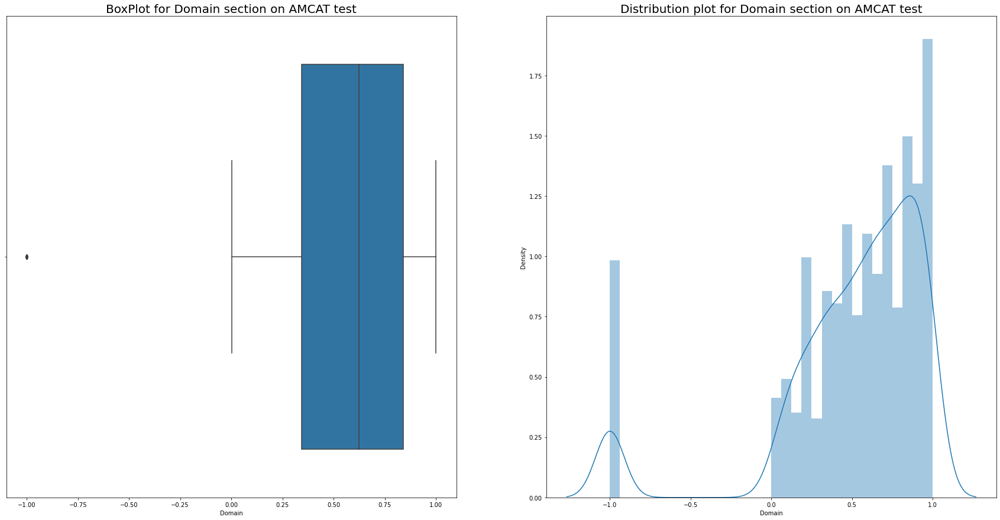

In [89]:
plt.figure(figsize= (30,15))

plt.subplot(121)
sns.boxplot(data['Domain'])
plt.title('BoxPlot for Domain section on AMCAT test', fontdict={'fontsize': 20})
plt.xticks(fontsize=10)

plt.subplot(122)
sns.distplot(data['Domain'])
plt.title('Distribution plot for Domain section on AMCAT test', fontdict={'fontsize': 20})
plt.xticks(fontsize=10)
plt.yticks(fontsize=10)

plt.show()

It can also be seen that this particualr column has been standardised and has the values ranging from -1 to 1.   
Amongst those who have attempted this particular section majority have obtained a score which is one standard deviation away from the mean score obtained by all those who have attempted the domain section of the test.

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning
/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


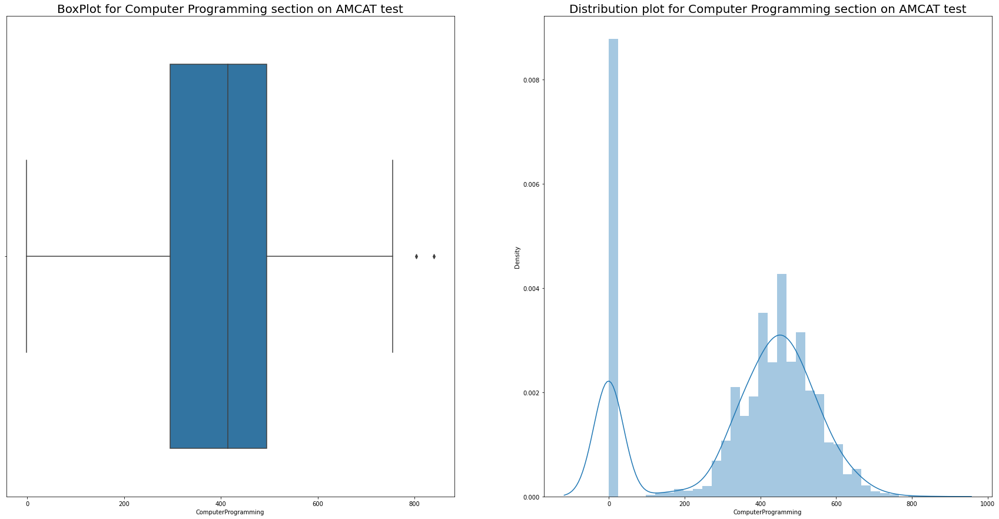

In [112]:
plt.figure(figsize= (30,15))

plt.subplot(121)
sns.boxplot(data['ComputerProgramming'])
plt.title('BoxPlot for Computer Programming section on AMCAT test', fontdict={'fontsize': 20})
plt.xticks(fontsize=10)

plt.subplot(122)
sns.distplot(data['ComputerProgramming'])
plt.title('Distribution plot for Computer Programming section on AMCAT test', fontdict={'fontsize': 20})
plt.xticks(fontsize=10)
plt.yticks(fontsize=10)


plt.show()

We can interpret from the above plots that majority of the people have not appeared for the Computer Programming section of the AMCAT test.  
Amongst those who appeared for the test we can see that a majority of the have scored approximately 470 marks in this particular section.  
There also exist a few outliers these are the people who have obtained a score greater than approximately 800.

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning
/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


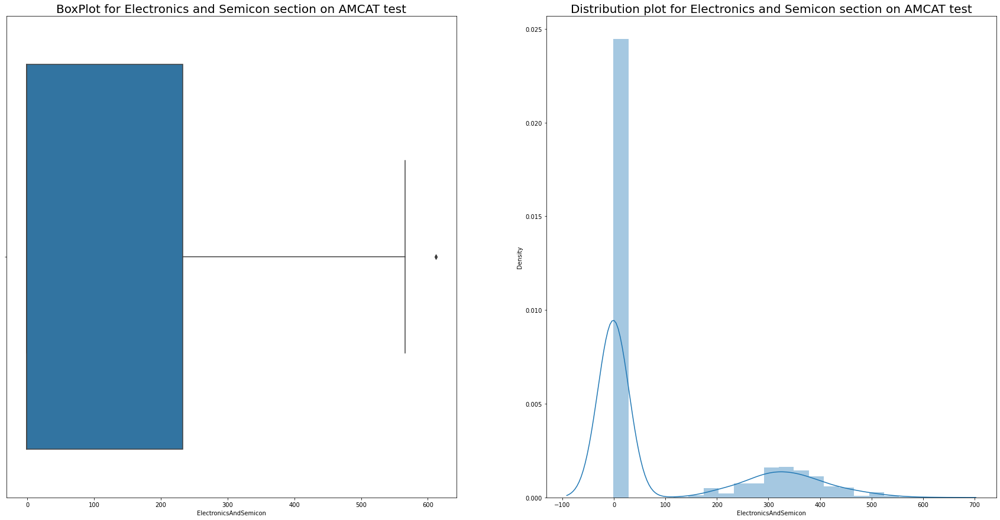

In [94]:
plt.figure(figsize= (30,15))

plt.subplot(121)
sns.boxplot(data['ElectronicsAndSemicon'])
plt.title('BoxPlot for Electronics and Semicon section on AMCAT test', fontdict={'fontsize': 20})
plt.xticks(fontsize=10)

plt.subplot(122)
sns.distplot(data['ElectronicsAndSemicon'])
plt.title('Distribution plot for Electronics and Semicon section on AMCAT test', fontdict={'fontsize': 20})
plt.xticks(fontsize=10)
plt.yticks(fontsize=10)

plt.show()

Almost 70-80% of the people haven't appeared for the Electronics and Semicon section of the AMCAT test.  
Out of the ones who have appeared majority of them have obtained a score of around 350.

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning
/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


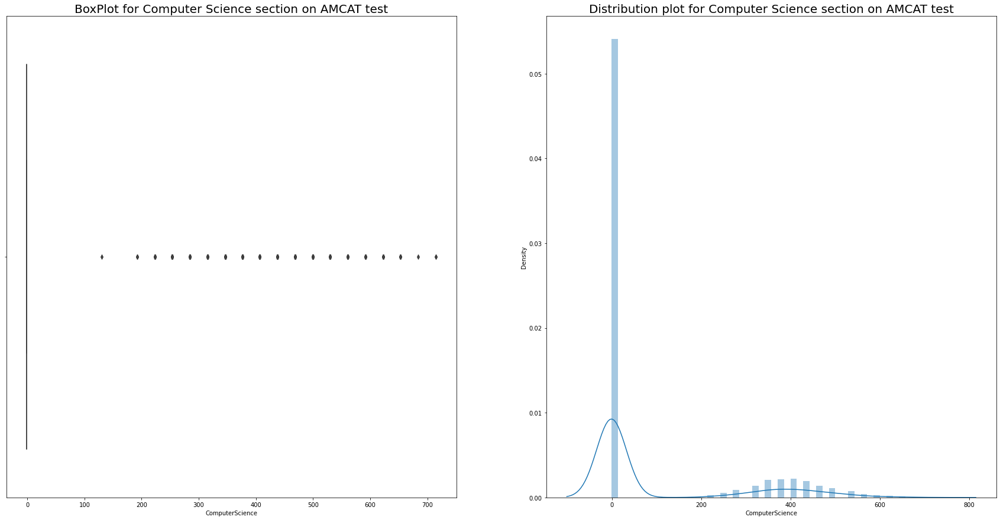

In [96]:
plt.figure(figsize= (30,15))

plt.subplot(121)
sns.boxplot(data['ComputerScience'])
plt.title('BoxPlot for Computer Science section on AMCAT test', fontdict={'fontsize': 20})
plt.xticks(fontsize=10)

plt.subplot(122)
sns.distplot(data['ComputerScience'])
plt.title('Distribution plot for Computer Science section on AMCAT test', fontdict={'fontsize': 20})
plt.xticks(fontsize=10)
plt.yticks(fontsize=10)

plt.show()

Due to the scarcity of data points, i.e. individuals who have appeared for the Computer Science section of the AMCAT test, the boxplot is giving us points as outliers instead of the quartiles.  
In the distribution plot we can see that hardly 20-30% of the people have attempted the Computer Science section of the AMCAT test.  
Amongst those who have attempted this particular section the majority of them have obtained marks in the range of approximately 360 - 440.

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning
/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


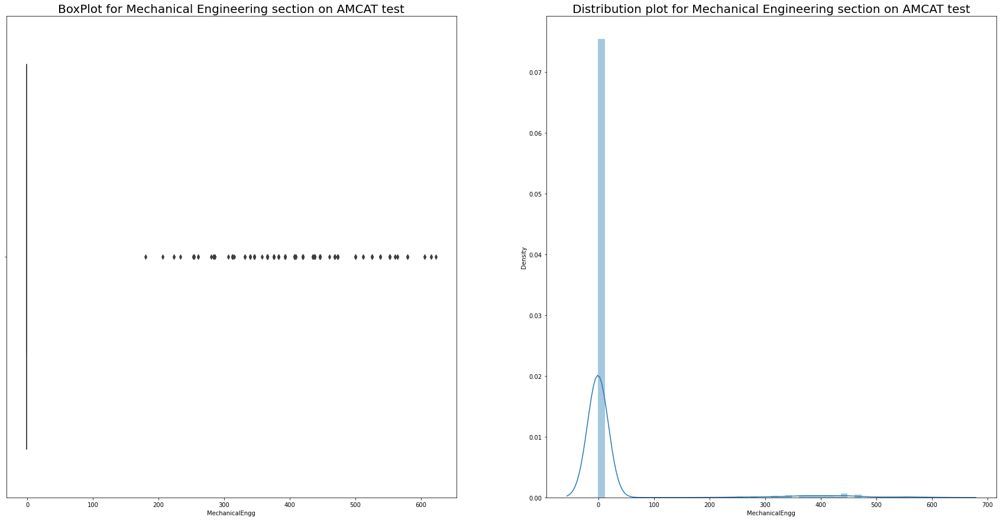

In [97]:
plt.figure(figsize= (30,15))

plt.subplot(121)
sns.boxplot(data['MechanicalEngg'])
plt.title('BoxPlot for Mechanical Engineering section on AMCAT test', fontdict={'fontsize': 20})
plt.xticks(fontsize=10)

plt.subplot(122)
sns.distplot(data['MechanicalEngg'])
plt.title('Distribution plot for Mechanical Engineering section on AMCAT test', fontdict={'fontsize': 20})
plt.xticks(fontsize=10)
plt.yticks(fontsize=10)

plt.show()

Due to the scarcity of data points, i.e. individuals who have appeared for the Mechanical Engineering section of the AMCAT test, the boxplot is giving us points as outliers instead of the quartiles.  
In the distribution plot we can see that hardly 10% of the people have attempted the Mechanical Engineering section of the AMCAT test.  
Amongst those who have attempted this particular section the majority of them have obtained marks in the range of approximately 440.

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning
/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


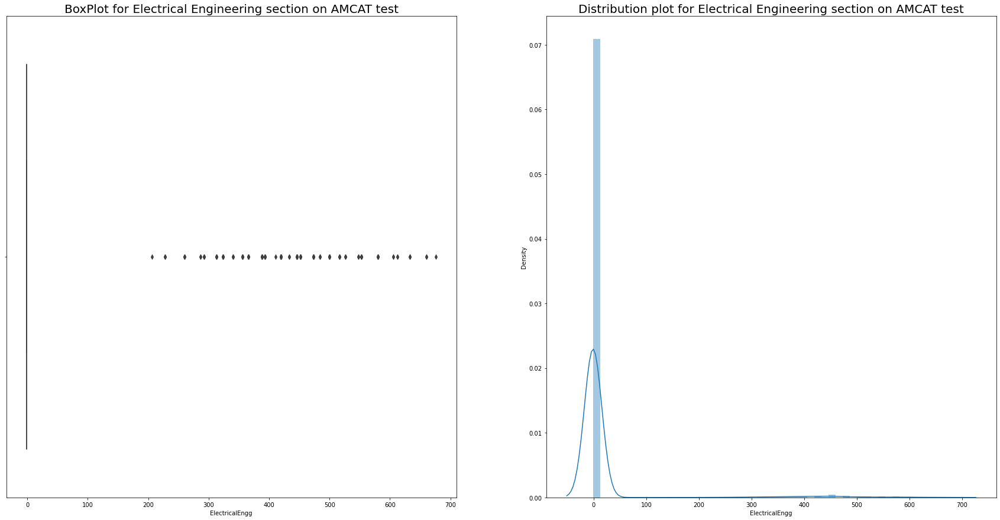

In [98]:
plt.figure(figsize= (30,15))

plt.subplot(121)
sns.boxplot(data['ElectricalEngg'])
plt.title('BoxPlot for Electrical Engineering section on AMCAT test', fontdict={'fontsize': 20})
plt.xticks(fontsize=10)

plt.subplot(122)
sns.distplot(data['ElectricalEngg'])
plt.title('Distribution plot for Electrical Engineering section on AMCAT test', fontdict={'fontsize': 20})
plt.xticks(fontsize=10)
plt.yticks(fontsize=10)

plt.show()

Due to the scarcity of data points, i.e. individuals who have appeared for the Electrical Engineering section of the AMCAT test, the boxplot is giving us points as outliers instead of the quartiles.  
In the distribution plot we can see that hardly 10% of the people have attempted the Electrical Engineering section of the AMCAT test.  
Amongst those who have attempted this particular section the majority of them have obtained marks of approximately 440.

Similar results can be seen for Telecom Engineering and Civil Engineering section of the AMCAT test below.

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning
/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


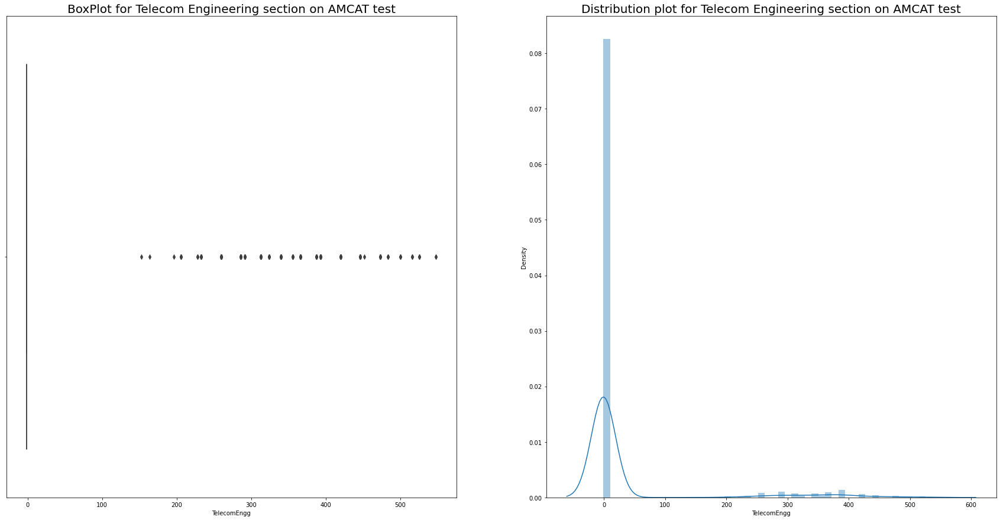

In [100]:
plt.figure(figsize= (30,15))

plt.subplot(121)
sns.boxplot(data['TelecomEngg'])
plt.title('BoxPlot for Telecom Engineering section on AMCAT test', fontdict={'fontsize': 20})
plt.xticks(fontsize=10)

plt.subplot(122)
sns.distplot(data['TelecomEngg'])
plt.title('Distribution plot for Telecom Engineering section on AMCAT test', fontdict={'fontsize': 20})
plt.xticks(fontsize=10)
plt.yticks(fontsize=10)

plt.show()

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning
/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


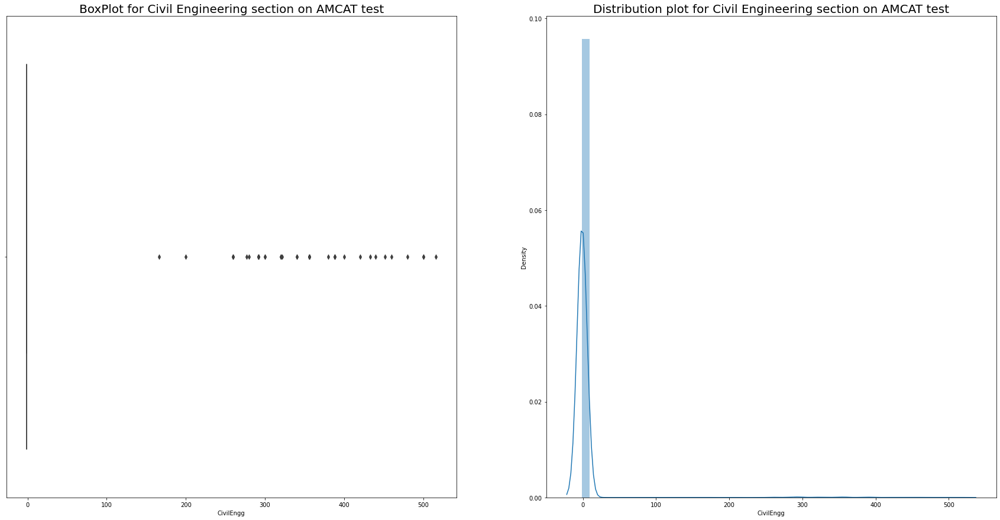

In [101]:
plt.figure(figsize= (30,15))

plt.subplot(121)
sns.boxplot(data['CivilEngg'])
plt.title('BoxPlot for Civil Engineering section on AMCAT test', fontdict={'fontsize': 20})
plt.xticks(fontsize=10)

plt.subplot(122)
sns.distplot(data['CivilEngg'])
plt.title('Distribution plot for Civil Engineering section on AMCAT test', fontdict={'fontsize': 20})
plt.xticks(fontsize=10)
plt.yticks(fontsize=10)

plt.show()

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning
/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


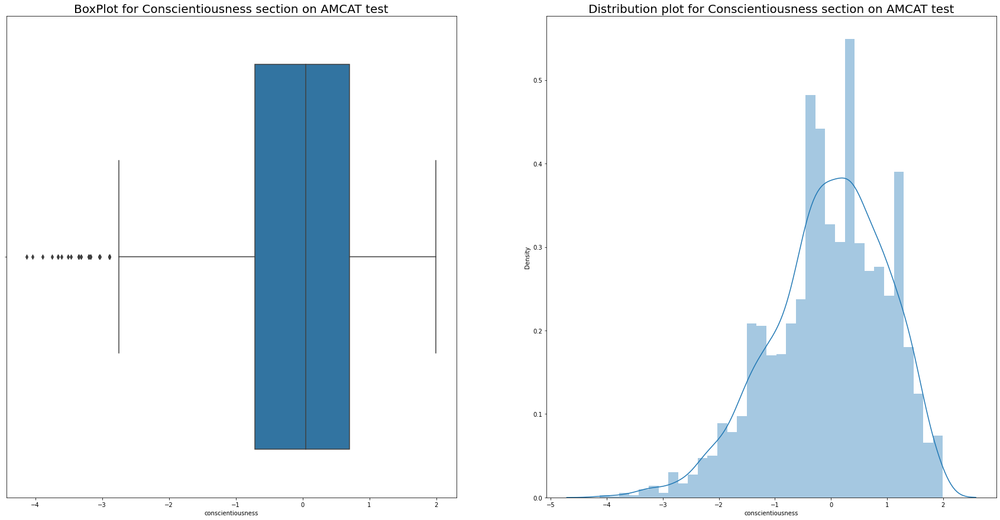

In [103]:
plt.figure(figsize= (30,15))

plt.subplot(121)
sns.boxplot(data['conscientiousness'])
plt.title('BoxPlot for Conscientiousness section on AMCAT test', fontdict={'fontsize': 20})
plt.xticks(fontsize=10)

plt.subplot(122)
sns.distplot(data['conscientiousness'])
plt.title('Distribution plot for Conscientiousness section on AMCAT test', fontdict={'fontsize': 20})
plt.xticks(fontsize=10)
plt.yticks(fontsize=10)

plt.show()

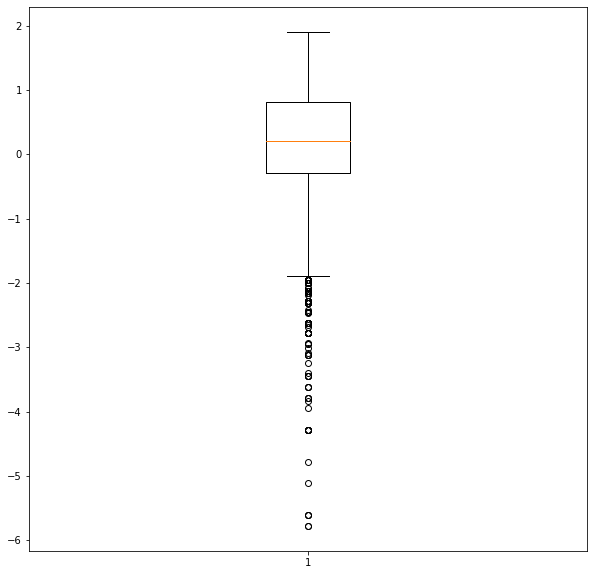

In [41]:
Pplt.figure(figsize= (10,10))
sns.boxplot(data['agreeableness'])
plt.show()

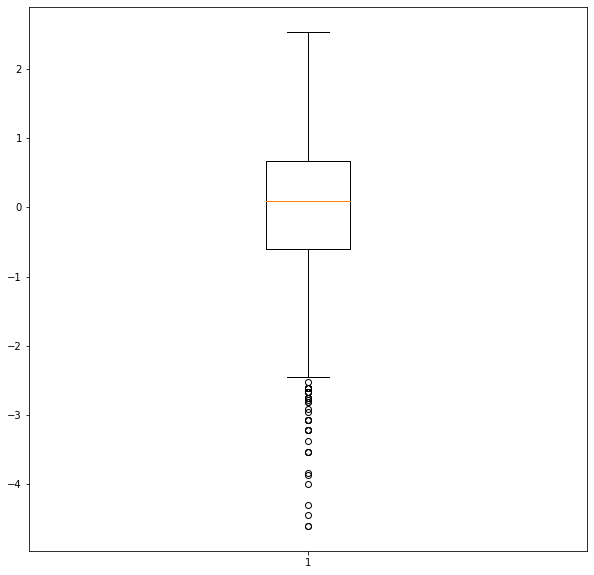

In [42]:
plt.figure(figsize= (10,10))
sns.boxplot(data['extraversion'])
plt.show()

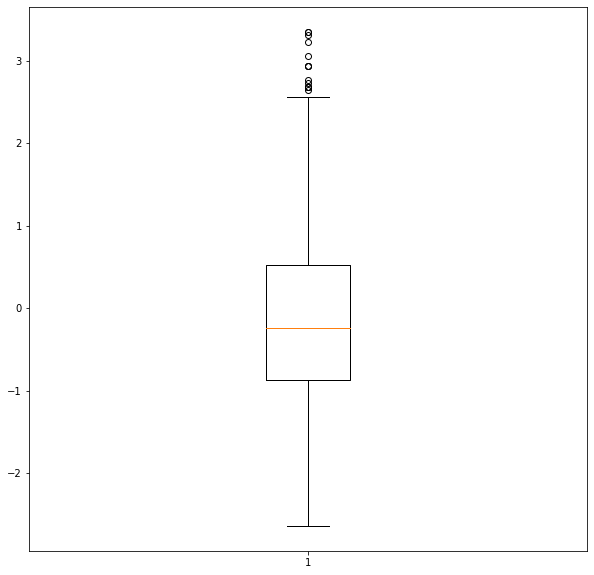

In [44]:
plt.figure(figsize= (10,10))
sns.boxplot(data['nueroticism'])
plt.show()

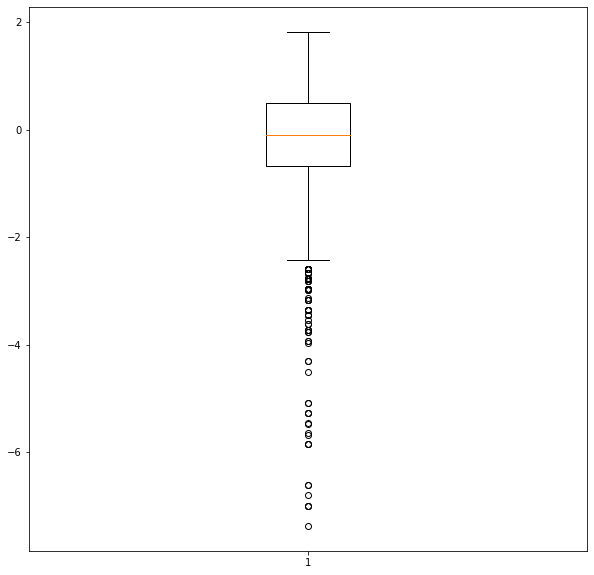

In [45]:
plt.figure(figsize= (10,10))
sns.boxplot(data['openess_to_experience'])
plt.show()

## Univariate Analysis (Categorical Columns)

In [100]:
plt.figure(figsize=(300,100))
sns.countplot(x='JobCity', data = data, order = data['JobCity'].value_counts().iloc[:15].index)
plt.xticks(fontsize=200)
plt.xticks(rotation=50)
plt.yticks(fontsize=200)

(array([  0., 100., 200., 300., 400., 500., 600., 700.]),
 <a list of 8 Text major ticklabel objects>)

The above graph shows that maximum number of people work in Bangalore and the number of people who have not given the name of the city they work in is the seccond highest.

In [103]:
plt.figure(figsize=(300,100))
sns.countplot(x='Gender', data = data)
plt.xticks(fontsize=300)
plt.yticks(fontsize=300)

(array([   0.,  500., 1000., 1500., 2000., 2500., 3000., 3500.]),
 <a list of 8 Text major ticklabel objects>)

The above countplot indicates that a greater percentage of the people are male in the given dataset.

In [45]:
plt.figure(figsize=(300,100))
sns.countplot(x='10board', data = data, order = data['10board'].value_counts().iloc[:15].index)
plt.xticks(fontsize=200)
plt.xticks(rotation=90)
plt.yticks(fontsize=200)

(array([   0.,  200.,  400.,  600.,  800., 1000., 1200., 1400., 1600.]),
 <a list of 9 Text major ticklabel objects>)

We can see from the count plot above that majority of the people have graduated from CBSE schools in their 10th standard.

In [44]:
plt.figure(figsize=(300,100))
sns.countplot(x='12board', data = data, order = data['12board'].value_counts().iloc[:15].index)
plt.xticks(fontsize=200)
plt.xticks(rotation=90)
plt.yticks(fontsize=200)

(array([   0.,  200.,  400.,  600.,  800., 1000., 1200., 1400., 1600.]),
 <a list of 9 Text major ticklabel objects>)

The top 15 boards of the 12th standard schools from which the different people graduated have been displayed in the above graph. We can see that maximum number of people studied in CBSE schools in the 12th standard.

In [105]:
plt.figure(figsize=(300,100))
sns.countplot(x='CollegeTier', data = data)
plt.xticks(fontsize=300)
plt.yticks(fontsize=300)

(array([   0.,  500., 1000., 1500., 2000., 2500., 3000., 3500., 4000.]),
 <a list of 9 Text major ticklabel objects>)

The countplot above clearly shows that maximum number of people who hae given their data had studied in 2nd tier colleges.

In [43]:
plt.figure(figsize=(300,100))
sns.countplot(x='Degree', data = data)
plt.xticks(fontsize=200)
plt.xticks(rotation=50)
plt.yticks(fontsize=200)

(array([   0.,  500., 1000., 1500., 2000., 2500., 3000., 3500., 4000.]),
 <a list of 9 Text major ticklabel objects>)

The above plot shows that maximum number of people have B.Tech or B.E. graduates while the least number of people are M.Sc. or M.Tech graduates. 

In [35]:
plt.figure(figsize=(300,100))
sns.countplot(x='Specialization', data = data, order = data['Specialization'].value_counts().iloc[:15].index)
plt.xticks(fontsize=200)
plt.xticks(rotation=90)
plt.yticks(fontsize=200)

(array([   0.,  200.,  400.,  600.,  800., 1000.]),
 <a list of 6 Text major ticklabel objects>)

The above countplot displays that the most common college specialization is electronics and communication engineering followed closely by computer science and engineering.

In [108]:
plt.figure(figsize=(300,100))
sns.countplot(x='CollegeState', data = data, order = data['CollegeState'].value_counts().iloc[:15].index)
plt.xticks(fontsize=200)
plt.xticks(rotation=50)
plt.yticks(fontsize=200)

(array([   0.,  200.,  400.,  600.,  800., 1000.]),
 <a list of 6 Text major ticklabel objects>)

The countplot displayed above indicates that maximum number of graduates are form the state of Uttar Pradesh. 

In [109]:
plt.figure(figsize=(300,100))
sns.countplot(x='GraduationYear', data = data)
plt.xticks(fontsize=200)
plt.xticks(rotation=50)
plt.yticks(fontsize=200)

(array([   0.,  200.,  400.,  600.,  800., 1000., 1200., 1400.]),
 <a list of 8 Text major ticklabel objects>)

From the countplot plotted above we can see that maximum graduates had graduated in the year of 2013 while there exist a few who haven't mentioned the year they graduated in.  
There are also a few outliers who graduated in the years 2007, 2009, 2016, and 2017

In [25]:
df = pd.DataFrame(data['DOJ'].dt.strftime("%Y"))
df.columns = ['DOJ']

plt.figure(figsize=(300,100))
sns.countplot(x='DOJ', data = df)
plt.xticks(fontsize=200)
plt.xticks(rotation=50)
plt.yticks(fontsize=200)

(array([   0.,  200.,  400.,  600.,  800., 1000., 1200., 1400., 1600.,
        1800.]), <a list of 10 Text major ticklabel objects>)

We can see by the countplot above that maximum number of employees had their joining date in 2014. There also exist a few outliers, these are those individulas who joined in the years of 1991, 2004, 2006, 2007, 2008, and 2009.

In [30]:
plt.figure(figsize=(300,100))
sns.countplot(x='12graduation', data = data)
plt.xticks(fontsize=200)
plt.xticks(rotation=50)
plt.yticks(fontsize=200)

(array([   0.,  200.,  400.,  600.,  800., 1000., 1200.]),
 <a list of 7 Text major ticklabel objects>)

Maximum number of employees are those who have graduated from high school in the year of 2009, while the outliers are those who graduated in the years of 1995, 1998, 1999, 2001, 2002, 2003, 2012 and 2013.

## Bivariate Analysis

<Figure size 720x720 with 0 Axes>

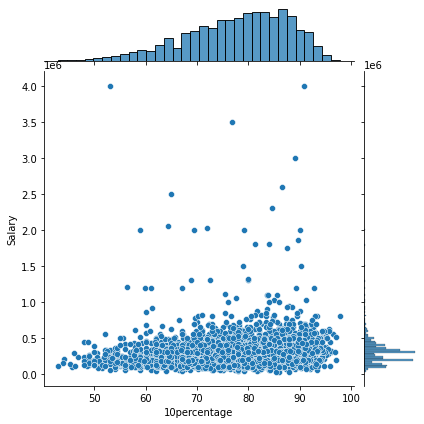

In [51]:
sns.jointplot(y = 'Salary', x = '10percentage', data = data, kind = 'scatter')

There seems to be no correlation between the two columns i.e., Salary and 10th percentage columns.

<Figure size 720x720 with 0 Axes>

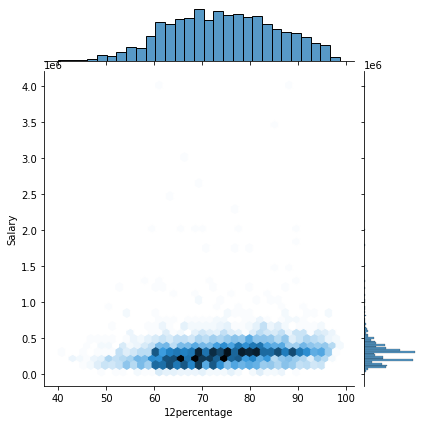

In [52]:
sns.jointplot(y = 'Salary', x = '12percentage', data = data, kind = 'hex')

There seems to be no correlation between the two columns.

<Figure size 1440x1440 with 0 Axes>

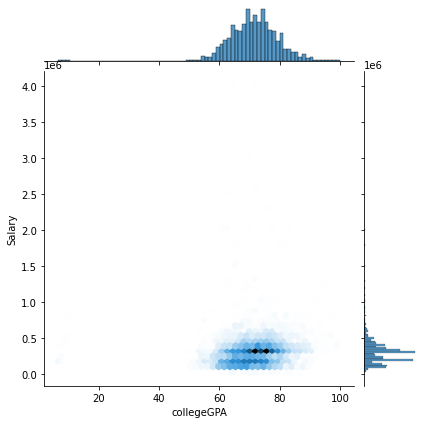

In [53]:
sns.jointplot(x = 'collegeGPA', y = 'Salary', data = data, kind = 'hex')

<Figure size 720x720 with 0 Axes>

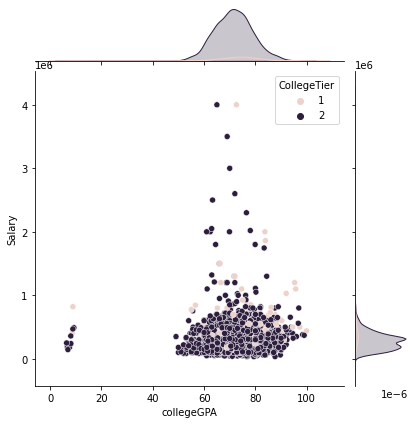

In [54]:
plt.figure(figsize=(10,10))
sns.jointplot(x = 'collegeGPA', y = 'Salary', hue = 'CollegeTier',  data = data)
plt.show()

It can be seen that a majority of the individuals are form 2nd tier colleges. there is no specific trend in regards to the college tier and Salary and even individuals from 2nd tier colleges are earning more than those from 1st tier colleges.

In [104]:
data.columns

Index(['Unnamed: 0', 'ID', 'Salary', 'DOJ', 'DOL', 'Designation', 'JobCity',
       'Gender', 'DOB', '10percentage', '10board', '12graduation',
       '12percentage', '12board', 'CollegeID', 'CollegeTier', 'Degree',
       'Specialization', 'collegeGPA', 'CollegeCityID', 'CollegeCityTier',
       'CollegeState', 'GraduationYear', 'English', 'Logical', 'Quant',
       'Domain', 'ComputerProgramming', 'ElectronicsAndSemicon',
       'ComputerScience', 'MechanicalEngg', 'ElectricalEngg', 'TelecomEngg',
       'CivilEngg', 'conscientiousness', 'agreeableness', 'extraversion',
       'nueroticism', 'openess_to_experience'],
      dtype='object')

In [109]:
new_data = data[['Gender', 'Salary', '10percentage', '12percentage', 'collegeGPA', 'English', 'Logical', 'Quant', 'openess_to_experience','agreeableness']]

In [110]:
new_data.head()

,Gender,Salary,10percentage,12percentage,collegeGPA,English,Logical,Quant,openess_to_experience,agreeableness
0,f,420000,84.3,95.8,78.00,515,585,525,-0.4455,0.8128
1,m,500000,85.4,85.0,70.06,695,610,780,0.8637,0.3789
2,f,325000,85.0,68.2,70.00,615,545,370,0.6721,1.7109
3,m,1100000,85.6,83.6,74.64,635,585,625,-0.9194,0.3448
4,m,200000,78.0,76.8,73.90,545,625,465,-0.1295,-0.2793


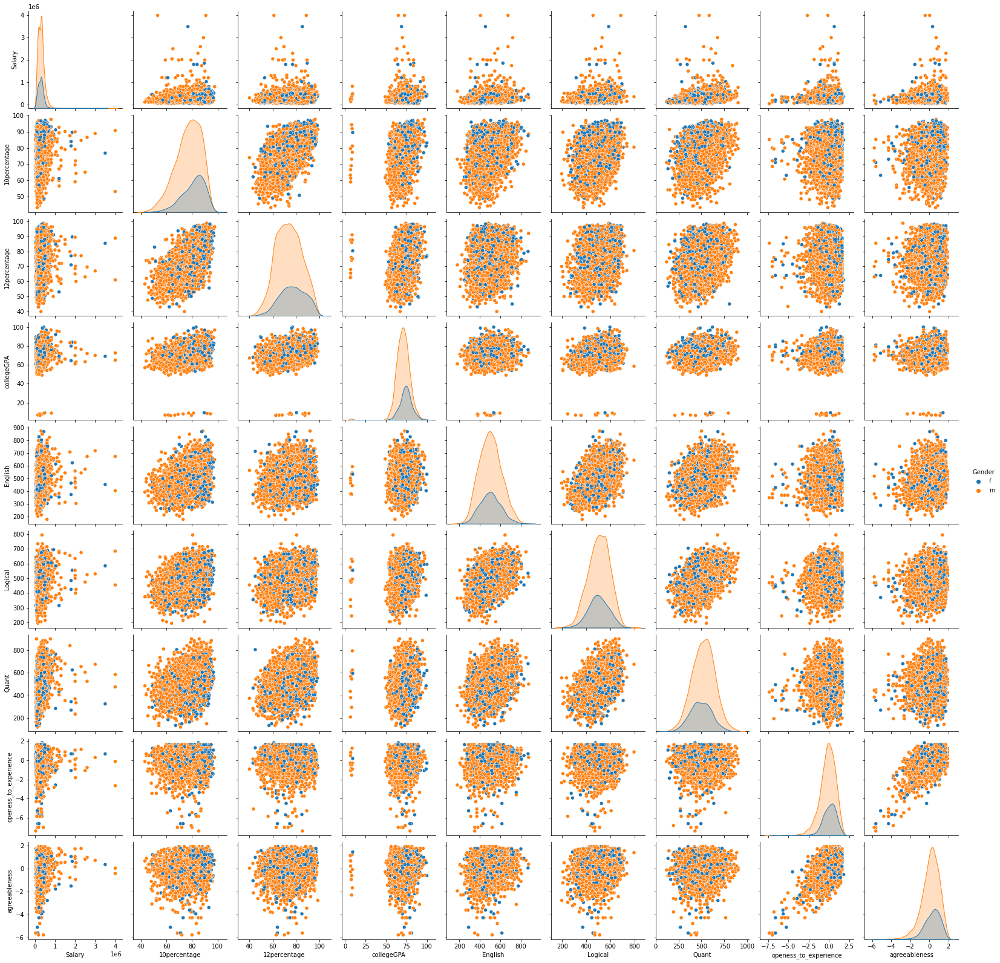

In [111]:
sns.pairplot(new_data, hue = 'Gender')

/usr/local/lib/python3.7/dist-packages/seaborn/categorical.py:1296: UserWarning: 12.5% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.7/dist-packages/seaborn/categorical.py:1296: UserWarning: 53.4% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)


Text(0.5, 1.0, 'College GPA based on Gender')

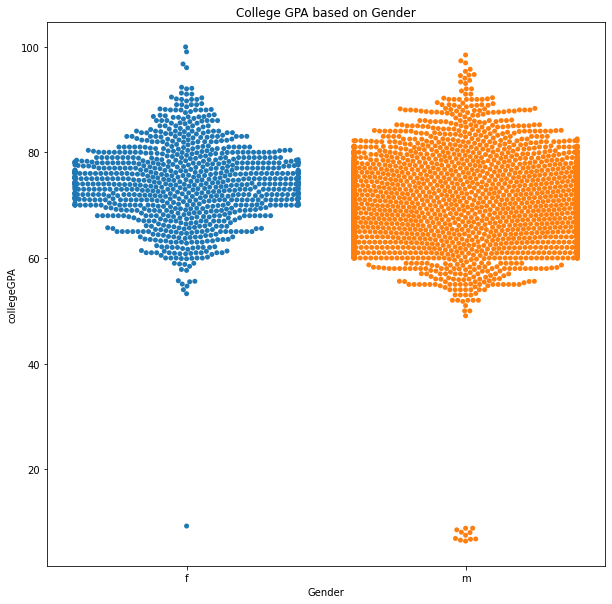

In [121]:
plt.figure(figsize=(10,10))
sns.swarmplot(data = data, y = 'collegeGPA', x = 'Gender')
plt.title("College GPA based on Gender")

Text(0.5, 1.0, 'College GPA according to the State of the College')

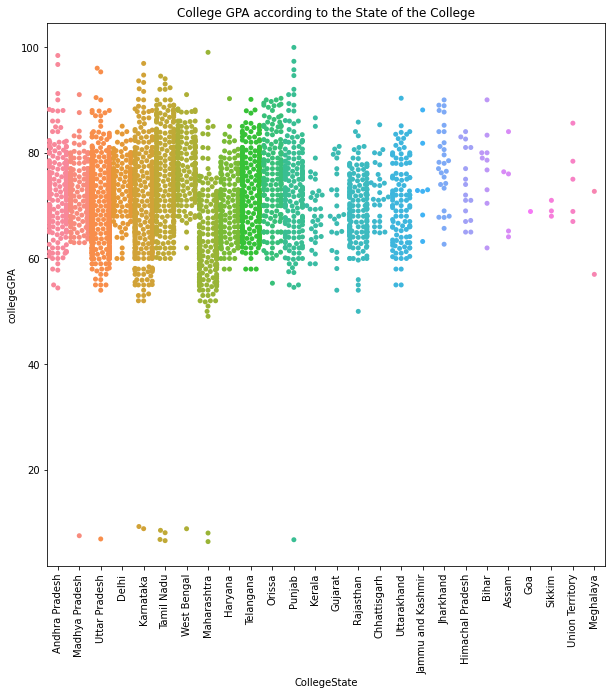

In [136]:
plt.figure(figsize=(10,10))
sns.swarmplot(data = data, y = 'collegeGPA', x = 'CollegeState')
plt.xticks(rotation = 90)
plt.title("College GPA according to the State of the College")

Text(0.5, 1.0, 'College GPA according to the College Tier')

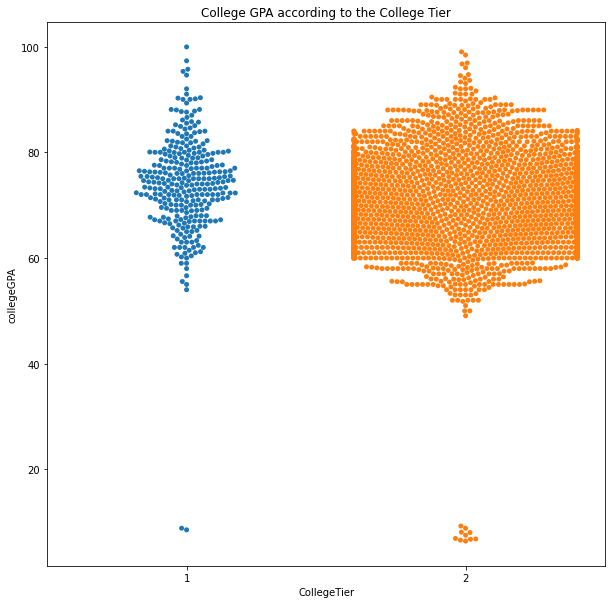

In [135]:
plt.figure(figsize=(10,10))
sns.swarmplot(data = data, y = 'collegeGPA', x = 'CollegeTier')
plt.title("College GPA according to the College Tier")

Text(0.5, 1.0, 'College GPA according to the Degree')

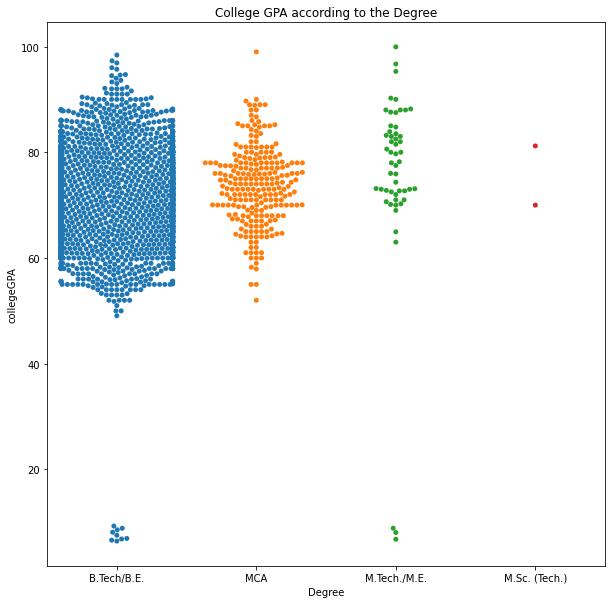

In [134]:
plt.figure(figsize=(10,10))
sns.swarmplot(data = data, y = 'collegeGPA', x = 'Degree')
plt.title("College GPA according to the Degree")

Text(0.5, 1.0, 'Salary according to the Designation')

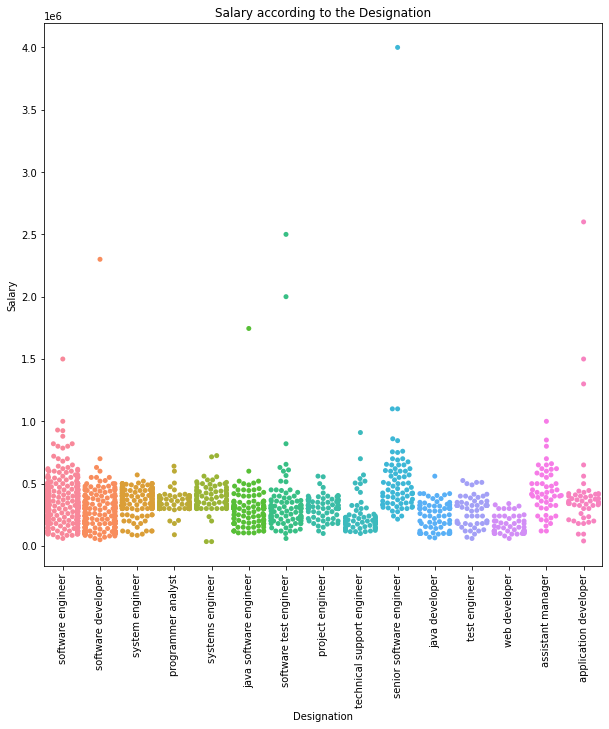

In [139]:
plt.figure(figsize=(10,10))
sns.swarmplot(data = data, y = 'Salary', x = 'Designation', order = data['Designation'].value_counts().iloc[:15].index)
plt.xticks(rotation = 90)
plt.title("Salary according to the Designation")

Text(0.5, 1.0, 'Salary according to the 12th standard board')

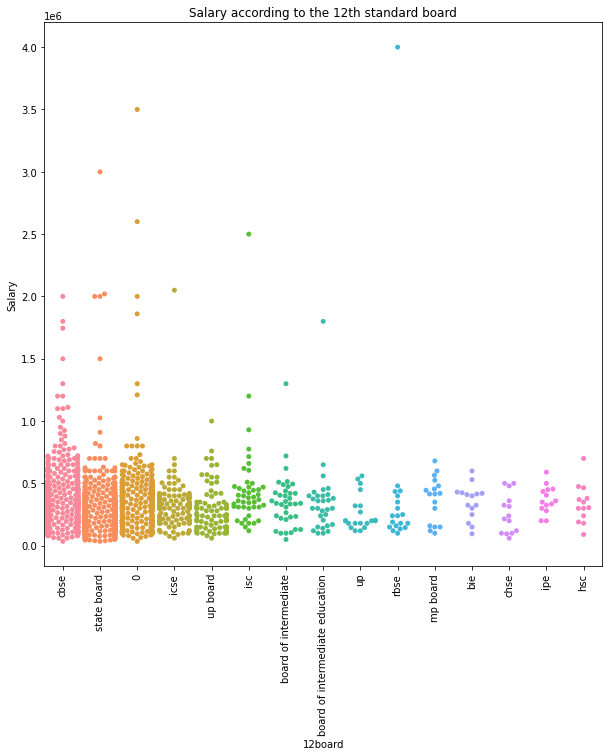

In [153]:
plt.figure(figsize=(10,10))
sns.swarmplot(data = data, y = 'Salary', x = '12board', order = data['12board'].value_counts().iloc[:15].index)
plt.xticks(rotation = 90)
plt.title("Salary according to the 12th standard board")

Text(0.5, 1.0, 'Salary according to the Year of 12th Standard Graduation')

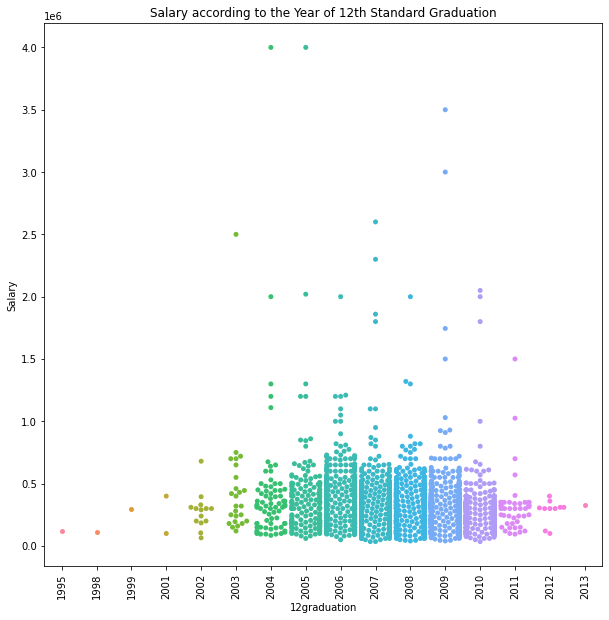

In [143]:
plt.figure(figsize=(10,10))
sns.swarmplot(data = data, y = 'Salary', x = '12graduation')
plt.xticks(rotation = 90)
plt.title("Salary according to the Year of 12th Standard Graduation")

Text(0.5, 1.0, 'Salary according to the College Graduation Year ')

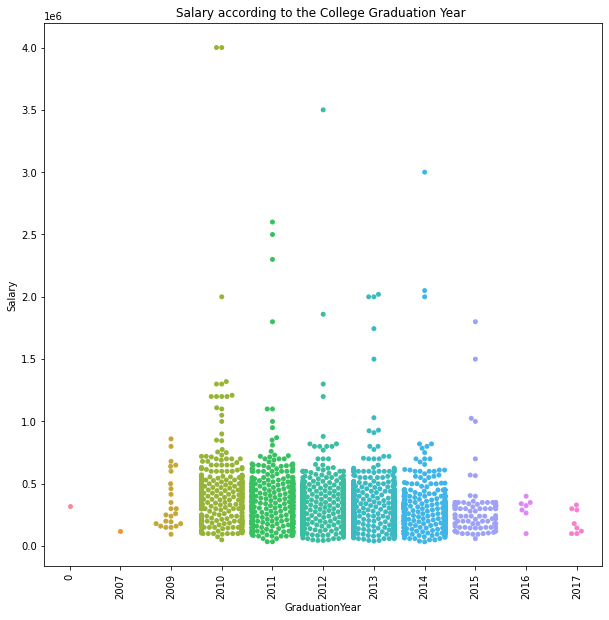

In [145]:
plt.figure(figsize=(10,10))
sns.swarmplot(data = data, y = 'Salary', x = 'GraduationYear')
plt.xticks(rotation = 90)
plt.title("Salary according to the College Graduation Year ")

Text(0.5, 1.0, 'College GPA according to the College Graduation Year')

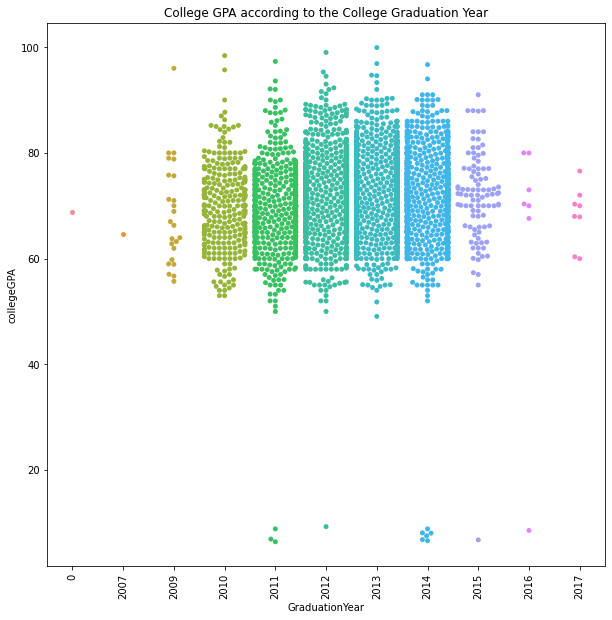

In [147]:
plt.figure(figsize=(10,10))
sns.swarmplot(data = data, y = 'collegeGPA', x = 'GraduationYear')
plt.xticks(rotation = 90)
plt.title("College GPA according to the College Graduation Year")

Text(0.5, 1.0, 'Salary according to the Specialization chosen by the candidate')

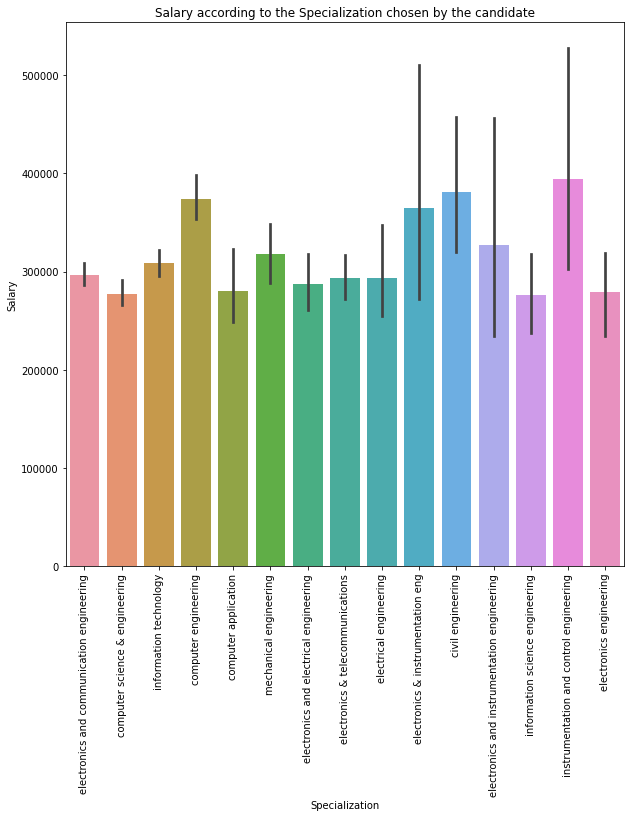

In [150]:
plt.figure(figsize=(10,10))
sns.barplot(data = data, y = 'Salary', x = 'Specialization', order = data['Specialization'].value_counts().iloc[:15].index)
plt.xticks(rotation = 90)
plt.title("Salary according to the Specialization chosen by the candidate")

Text(0.5, 1.0, 'College GPA according to the Specialization chosen by the candidate')

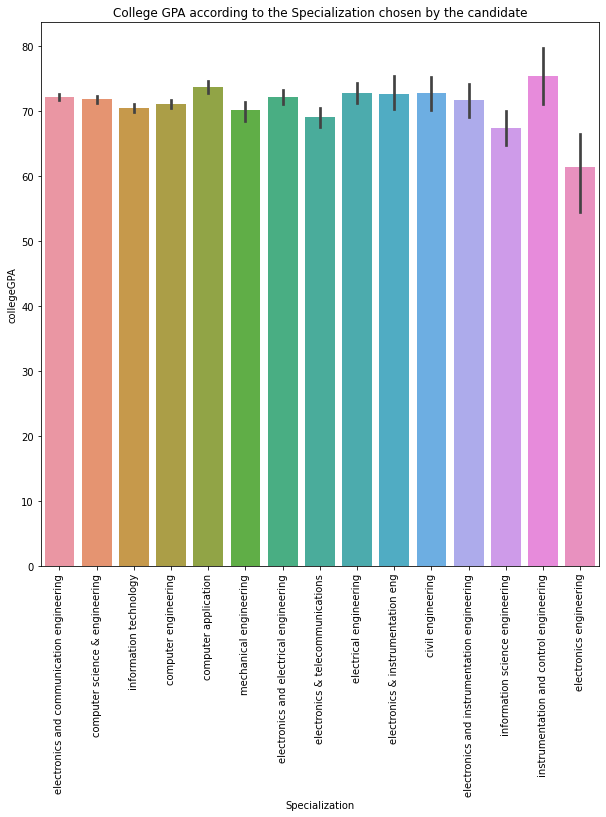

In [151]:
plt.figure(figsize=(10,10))
sns.barplot(data = data, y = 'collegeGPA', x = 'Specialization', order = data['Specialization'].value_counts().iloc[:15].index)
plt.xticks(rotation = 90)
plt.title("College GPA according to the Specialization chosen by the candidate")

Text(0.5, 1.0, 'Salary according to the Job Location')

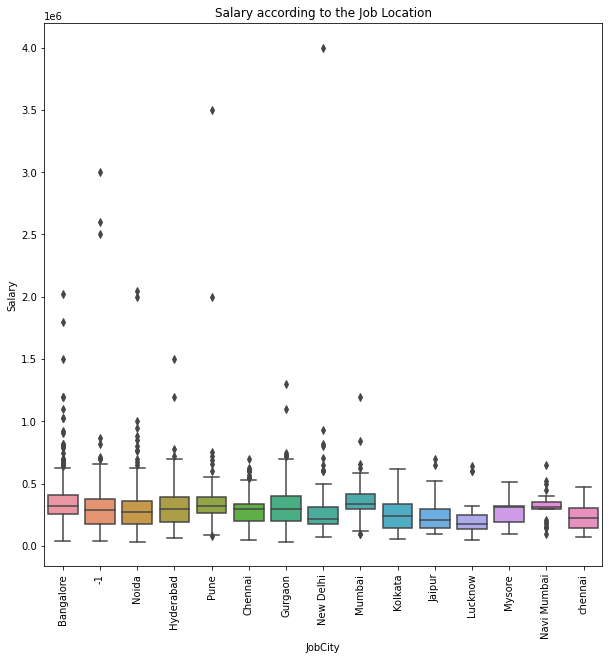

In [152]:
plt.figure(figsize=(10,10))
sns.boxplot(data = data, y = 'Salary', x = 'JobCity', order = data['JobCity'].value_counts().iloc[:15].index)
plt.xticks(rotation = 90)
plt.title("Salary according to the Job Location")

Text(0.5, 1.0, 'Salary according to the Job Location')

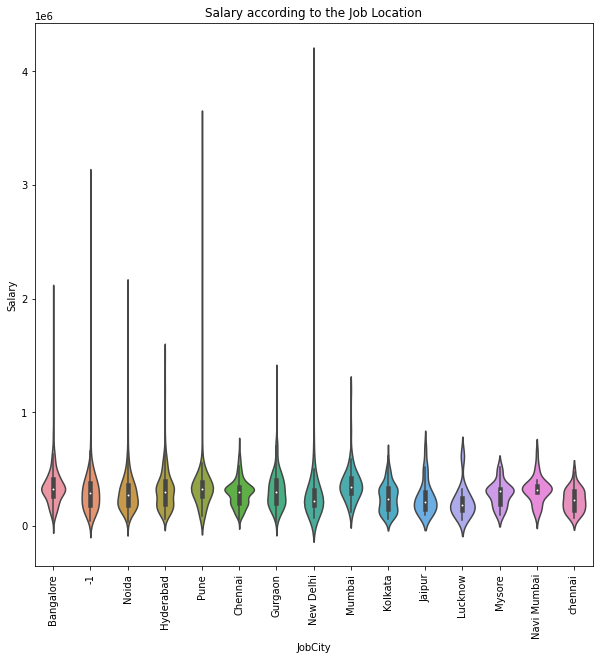

In [154]:
plt.figure(figsize=(10,10))
sns.violinplot(data = data, y = 'Salary', x = 'JobCity', order = data['JobCity'].value_counts().iloc[:15].index)
plt.xticks(rotation = 90)
plt.title("Salary according to the Job Location")

In [240]:
data[data['Designation'] == 'programmer analyst']['Designation'].value_counts()

programmer analyst    139
Name: Designation, dtype: int64

In [164]:
data[data['Designation'] == 'software engineer']['Designation'].value_counts()

software engineer    539
Name: Designation, dtype: int64

In [167]:
data[data['Designation'] == 'hardware engineer']['Designation'].value_counts()

hardware engineer    8
Name: Designation, dtype: int64

In [168]:
data[data['Designation'] == 'associate engineer']['Designation'].value_counts()

associate engineer    6
Name: Designation, dtype: int64

In [241]:
data_hyp = data.loc[data['Designation'].isin(['programmer analyst', 'software engineer', 'hardware engineer', 'associate engineer'])]
data_hyp.head()

,Unnamed: 0,ID,Salary,DOJ,DOL,Designation,JobCity,Gender,DOB,10percentage,10board,12graduation,12percentage,12board,CollegeID,CollegeTier,Degree,Specialization,collegeGPA,CollegeCityID,CollegeCityTier,CollegeState,GraduationYear,English,Logical,Quant,Domain,ComputerProgramming,ElectronicsAndSemicon,ComputerScience,MechanicalEngg,ElectricalEngg,TelecomEngg,CivilEngg,conscientiousness,agreeableness,extraversion,nueroticism,openess_to_experience
19,train,466888,325000,2014-09-01,present,software engineer,Pune,f,1990-11-30,79.00,cbse,2008,62.20,cbse,7977,2,B.Tech/B.E.,computer engineering,76.30,7977,0,Uttar Pradesh,2012,485,445,435,0.864685,525,-1,-1,-1,-1,-1,-1,0.8192,0.2668,-0.2714,-0.40780,-0.1295
20,train,140069,320000,2010-11-01,2012-09-01 00:00:00,software engineer,Bangalore,f,1988-07-25,91.20,karnataka secondary school of examination,2006,84.63,karnataka pre university board,4437,2,B.Tech/B.E.,computer engineering,78.15,4437,0,Karnataka,2010,455,535,445,0.635979,445,-1,-1,-1,-1,-1,-1,-0.1082,0.9688,0.5269,-0.29020,0.3444
21,train,339689,200000,2012-08-01,2013-12-01 00:00:00,software engineer,-1,f,1991-08-20,75.67,up,2007,74.40,up,11368,2,B.Tech/B.E.,information technology,74.01,11368,0,Uttar Pradesh,2012,385,555,445,0.635979,445,-1,-1,-1,-1,-1,-1,-1.0355,-0.5913,-1.3599,0.06223,-1.3539
24,train,963123,335000,2014-06-01,2015-06-01 00:00:00,programmer analyst,Hyderabad,m,1993-06-28,88.00,state board,2010,90.00,state board,9173,2,B.Tech/B.E.,computer science & engineering,76.00,9173,1,Telangana,2014,625,555,630,0.356536,475,-1,346,-1,-1,-1,-1,0.4155,0.8027,0.1357,-0.99500,-0.6692
31,train,1094324,340000,2014-08-01,2015-04-01 00:00:00,software engineer,Bangalore,m,1992-10-23,77.20,state board,2010,86.10,state board,7282,2,B.Tech/B.E.,computer science & engineering,71.00,7282,0,Tamil Nadu,2014,560,485,450,0.622643,485,-1,407,-1,-1,-1,-1,-0.0154,1.2114,1.0859,-1.50210,0.2889


In [266]:
data_hyp['Specialization'].value_counts()

computer science & engineering                 167
information technology                         139
electronics and communication engineering      136
computer engineering                           135
computer application                            34
electronics & telecommunications                20
electronics and electrical engineering          14
electrical engineering                           9
information science engineering                  7
electronics and instrumentation engineering      4
electronics & instrumentation eng                4
instrumentation and control engineering          4
electronics engineering                          3
mechanical engineering                           3
telecommunication engineering                    2
information & communication technology           1
computer and communication engineering           1
information science                              1
industrial & production engineering              1
biotechnology                  

In [270]:
data_hyp = data_hyp[data_hyp['Specialization'].isin(['computer engineering', 'computer science & engineering'])]

In [271]:
data_hyp['DOJ'] = data['DOJ'].dt.strftime("%Y")

In [272]:
data_hyp = data_hyp.reset_index()
data_hyp.head()

,level_0,index,Unnamed: 0,ID,Salary,DOJ,DOL,Designation,JobCity,Gender,DOB,10percentage,10board,12graduation,12percentage,12board,CollegeID,CollegeTier,Degree,Specialization,collegeGPA,CollegeCityID,CollegeCityTier,CollegeState,GraduationYear,English,Logical,Quant,Domain,ComputerProgramming,ElectronicsAndSemicon,ComputerScience,MechanicalEngg,ElectricalEngg,TelecomEngg,CivilEngg,conscientiousness,agreeableness,extraversion,nueroticism,openess_to_experience
0,0,19,train,466888,325000,2012,present,software engineer,Pune,f,1990-11-30,79.0,cbse,2008,62.20,cbse,7977,2,B.Tech/B.E.,computer engineering,76.30,7977,0,Uttar Pradesh,2012,485,445,435,0.864685,525,-1,-1,-1,-1,-1,-1,0.8192,0.2668,-0.2714,-0.4078,-0.1295
1,1,20,train,140069,320000,2013,2012-09-01 00:00:00,software engineer,Bangalore,f,1988-07-25,91.2,karnataka secondary school of examination,2006,84.63,karnataka pre university board,4437,2,B.Tech/B.E.,computer engineering,78.15,4437,0,Karnataka,2010,455,535,445,0.635979,445,-1,-1,-1,-1,-1,-1,-0.1082,0.9688,0.5269,-0.2902,0.3444
2,3,24,train,963123,335000,2011,2015-06-01 00:00:00,programmer analyst,Hyderabad,m,1993-06-28,88.0,state board,2010,90.00,state board,9173,2,B.Tech/B.E.,computer science & engineering,76.00,9173,1,Telangana,2014,625,555,630,0.356536,475,-1,346,-1,-1,-1,-1,0.4155,0.8027,0.1357,-0.9950,-0.6692
3,4,31,train,1094324,340000,2014,2015-04-01 00:00:00,software engineer,Bangalore,m,1992-10-23,77.2,state board,2010,86.10,state board,7282,2,B.Tech/B.E.,computer science & engineering,71.00,7282,0,Tamil Nadu,2014,560,485,450,0.622643,485,-1,407,-1,-1,-1,-1,-0.0154,1.2114,1.0859,-1.5021,0.2889
4,5,36,train,602377,270000,2014,present,software engineer,Hyderabad,f,1992-08-21,91.5,state board,2009,93.80,state board,11509,1,B.Tech/B.E.,computer engineering,74.10,11509,1,Telangana,2013,380,535,530,0.525923,415,-1,-1,-1,-1,-1,-1,-1.0208,0.2124,0.4711,0.2727,-0.0943


In [273]:
count = 0
for i in range(data_hyp.shape[0]):
  if int(data_hyp['DOJ'][i]) == int(data_hyp['GraduationYear'][i]):
    count += 1
print(count)

67


In [274]:
hyp_salary = []
for i in range(data_hyp.shape[0]):
  if int(data_hyp['DOJ'][i]) == int(data_hyp['GraduationYear'][i]):
    hyp_salary.append(data_hyp['Salary'][i]) 

In [275]:
pop_mean = 300000
len(hyp_salary)

67

Step 1:
Alternate Hypothesis (Bold Claim):
$$H_1:\, \mu < 300,000$$
Null Hypothese Status Quo):
$$H_0:\, \mu \geq 300,000$$
Step 2:
* Collect a sample of size n = 20


In [276]:
sample_size = 20
sample_hyp = random.sample(hyp_salary, sample_size)

Step 2:
* Compute sample mean
$$\bar{x} = 330,500$$

In [277]:
sample_mean = np.mean(sample_hyp)
sample_std = np.std(sample_hyp)

Step 3:
Compute Test Statistic:
$$t = \frac{\bar{x}-\mu}{s/\sqrt[2]{n}}$$

In [278]:
numerator = sample_mean - pop_mean
denominator = sample_std / ((sample_size - 1)**0.5)
tScore = numerator / denominator
print(tScore)

1.3051910947603014


Step 4:  
Decide $\alpha$ or significance level

In [279]:
confidence_level = 0.95

alpha = 1 - confidence_level

Step 5.1:  
Left tailed t-test is being used here since the < sign is present in the Alternate Hypothesis. 
$$ t < t_{n-1, \alpha}\Rightarrow\, Accept\, H_1\, or\, Reject\, H_0$$

In [280]:
t_critical = t.ppf(1 - alpha, df = 19)

print(t_critical)

1.729132811521367


In [291]:
normalised_salary = [float(i) / 100000 for i in hyp_salary]
normalised_std = np.std(normalised_salary)
normalised_mean = np.mean(normalised_salary)

Text(3.2432835820895525, 0.02, 'x_bar')

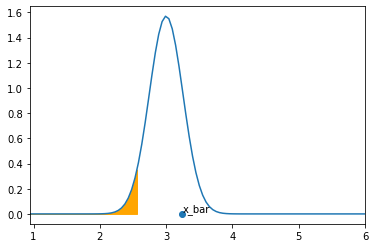

In [292]:
#Plotting the sampling distribution with rejection regions

#Defining the x minimum and the x maximum
x_min = min(normalised_salary)
x_max = max(normalised_salary)

#Defining the sampling distribution mean and sampling distribution std
mean = 3.0
std = normalised_std / (sample_size**0.5)

#Plotting the graph and setting the x limits
x = np.linspace(x_min, x_max, 100)
y = norm.pdf(x, mean, std)
plt.xlim(x_min, x_max)
plt.plot(x, y)

#Computing the left and right critical values (Left tailed test)
t_critical_left = mean + (-t_critical * std)

#Shading the left rejection region
x1 = np.linspace(x_min, t_critical_left, 100)
y1 = norm.pdf(x1, mean, std)
plt.fill_between(x1, y1, color='orange')

#Plotting the sample mean and concluding the results
plt.scatter(normalised_mean, 0)
plt.annotate("x_bar", (normalised_mean, 0.02))

#In this case the sample mean doesn't fall in the rejection region 
#i.e. here we Fail to reject the Null Hypothesis

In [293]:
#Conclusion using t-test

if (tScore > t_critical):
  print("Reject Null Hypothesis")
else:
  print("Fail to reject Null Hypothesis")

Fail to reject Null Hypothesis


Step 5.2:  
Compute p-value

In [294]:
#Conclusion using p test

p_value = 1.0 - norm.cdf(abs(tScore))

print("p_value = ", p_value)

if (p_value < alpha):
  print("Reject Null Hypothesis")
else:
  print("Fail to reject Null Hypothesis")

p_value =  0.09591389288665675
Fail to reject Null Hypothesis


## Conclusion